In [2]:
import matplotlib.pyplot as plt
import numpy as np
import sympy as sp
from scipy import linalg as la
sp.init_printing() 
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import seaborn as sns

## **Healthy Dog Vet Records Dataset:**

In [2]:
dogs = pd.read_excel('Healthy_Dog_Vet_Reports.xlsx')  
dogs.shape

In [3]:
dogs

,QuestionnaireID,PetId,Date Completed,Age (months),Age (weeks),Age (days),Age (years),Age years by days/365,Age segment,Energetic/Enthusiastic,...,BreedId,Breed,BreedGroupId,BreedGroupName,Gender,Date of Birth,DoBEstimated,Neutered,age in months,age segment
0,11422,5627,2018-03-25,37,160.714286,1125,3,3.082192,young,3.51,...,1,Other (Small),1,Small,F,2015-02-24,False,True,1.0,young
1,11417,7332,2018-03-24,133,579.142857,4054,11,11.106849,old,3.96,...,177,Retriever - Labrador,3,Large,F,2007-02-16,False,True,2.0,young
2,11397,7320,2018-03-22,4,17.857143,125,0,0.342466,young,4.15,...,303,West Highland White Terrier,1,Small,M,2017-11-17,False,False,3.0,young
3,11398,7321,2018-03-22,55,243.000000,1701,4,4.660274,middle-aged,3.83,...,163,Jack/Parson Russell Terrier,1,Small,F,2013-07-25,False,True,4.0,young
4,11399,2152,2018-03-22,43,187.142857,1310,3,3.589041,young,3.79,...,86,Chihuahua - Long Coat,1,Small,F,2014-08-20,False,False,5.0,young
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3406,1477,1083,2014-11-13,55,242.714286,1699,4,4.654795,middle-aged,4.15,...,274,Spaniel - English Springer,2,Medium,F,2010-03-20,False,False,NaN,NaN
3407,1479,1085,2014-11-13,44,192.571429,1348,3,3.693151,young,4.15,...,129,German Pointer- Shorthaired,3,Large,M,2011-03-06,False,False,NaN,NaN
3408,1480,1086,2014-11-13,89,388.857143,2722,7,7.457534,middle-aged,3.45,...,163,Jack/Parson Russell Terrier,1,Small,F,2007-06-01,False,False,NaN,NaN
3409,1481,1087,2014-11-13,50,221.000000,1547,4,4.238356,middle-aged,4.03,...,303,West Highland White Terrier,1,Small,F,2010-08-19,False,False,NaN,NaN


In [4]:
dogs.dtypes

QuestionnaireID                    int64
PetId                              int64
Date Completed            datetime64[ns]
Age (months)                       int64
Age (weeks)                      float64
Age (days)                         int64
Age (years)                        int64
Age years by days/365            float64
Age segment                       object
Energetic/Enthusiastic           float64
Happy/Content                    float64
Active/Comfortable               float64
Calm/Relaxed                     float64
IsOldPet                            bool
In Perfect Health                 object
BreedId                            int64
Breed                             object
BreedGroupId                       int64
BreedGroupName                    object
Gender                            object
Date of Birth             datetime64[ns]
DoBEstimated                        bool
Neutered                            bool
age in months                    float64
age segment     

In [5]:
dogs = dogs.drop(['DoBEstimated', 'age in months', 'age segment'], axis = 1) # Unneeded columns 

dogs.rename(columns = {'Age years by days/365': 'Age(float)', 'Date of Birth': 'DoB', 'In Perfect Health': 'InPerfectHealth', \
                      'Age (months)': 'Age(months)', 'Age (weeks)': 'Age(weeks)', 'Age (days)': 'Age(days)', 'Age (years)': 'Age(years)', \
                      'Age segment': 'AgeSegment', 'Neutered': 'IsNeutered'}, inplace = True) # Renamed for simplicity

dogs.loc[dogs["InPerfectHealth"] == "qol.transition_question.answer.yes", "InPerfectHealth"] = "Yes"

dogs["InPerfectHealth"] = (dogs["InPerfectHealth"] == "Yes") # Changing values in "InPerfectHealth" from "Yes" and "No" to T/F

In [6]:
dogs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3411 entries, 0 to 3410
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   QuestionnaireID         3411 non-null   int64         
 1   PetId                   3411 non-null   int64         
 2   Date Completed          3411 non-null   datetime64[ns]
 3   Age(months)             3411 non-null   int64         
 4   Age(weeks)              3411 non-null   float64       
 5   Age(days)               3411 non-null   int64         
 6   Age(years)              3411 non-null   int64         
 7   Age(float)              3411 non-null   float64       
 8   AgeSegment              3411 non-null   object        
 9   Energetic/Enthusiastic  3411 non-null   float64       
 10  Happy/Content           3411 non-null   float64       
 11  Active/Comfortable      3411 non-null   float64       
 12  Calm/Relaxed            3411 non-null   float64 

In [7]:
dogs.describe().T

,count,mean,min,25%,50%,75%,max,std
QuestionnaireID,3411.0,5621.117854,1464.0,2949.5,5088.0,8254.0,11422.0,2975.730537
PetId,3411.0,3749.757549,1070.0,2279.5,3568.0,4990.5,7332.0,1703.5497
Date Completed,3411,2016-04-12 23:37:37.519789056,2014-11-12 00:00:00,2015-05-19 12:00:00,2016-03-09 00:00:00,2017-02-15 00:00:00,2018-03-25 00:00:00,NaN
Age(months),3411.0,47.163002,3.0,14.0,35.0,71.5,206.0,40.176252
Age(weeks),3411.0,207.092181,16.0,64.357143,153.0,313.071429,898.142857,174.651678
Age(days),3411.0,1449.645265,112.0,450.5,1071.0,2191.5,6287.0,1222.561744
Age(years),3411.0,3.486074,0.0,1.0,2.0,5.5,17.0,3.366999
Age(float),3411.0,3.971631,0.306849,1.234247,2.934247,6.00411,17.224658,3.349484
Energetic/Enthusiastic,3411.0,3.676608,0.97,3.45,3.84,4.09,4.15,0.529415
Happy/Content,3411.0,5.644808,1.98,5.39,5.91,6.0,6.0,0.519999


In [39]:
dogs['Breed'].value_counts()

Breed
Retriever - Labrador                 333
Spaniel - English Cocker             202
Jack/Parson Russell Terrier          180
Mixed (Medium)                       180
Cross Breed (Unknown X )/ Mongrel    169
                                    ... 
Welsh Terrier                          1
Norwich / Norfolk Terrier              1
Griffon - Brussels / Bruxellois        1
Tibetan Spaniel                        1
German Spitz (Klein)                   1
Name: count, Length: 157, dtype: int64

In [40]:
dogs['Gender'].value_counts()

Gender
M    1813
F    1598
Name: count, dtype: int64

In [41]:
dogs['InPerfectHealth'].value_counts()

InPerfectHealth
True     3405
False       6
Name: count, dtype: int64

In [43]:
dogs.isna().sum()

QuestionnaireID           0
PetId                     0
Date Completed            0
Age(months)               0
Age(weeks)                0
Age(days)                 0
Age(years)                0
Age(float)                0
AgeSegment                0
Energetic/Enthusiastic    0
Happy/Content             0
Active/Comfortable        0
Calm/Relaxed              0
IsOldPet                  0
InPerfectHealth           0
BreedId                   0
Breed                     0
BreedGroupId              0
BreedGroupName            0
Gender                    0
DoB                       0
IsNeutered                0
dtype: int64

In [44]:
dogs.head()

,QuestionnaireID,PetId,Date Completed,Age(months),Age(weeks),Age(days),Age(years),Age(float),AgeSegment,Energetic/Enthusiastic,...,Calm/Relaxed,IsOldPet,InPerfectHealth,BreedId,Breed,BreedGroupId,BreedGroupName,Gender,DoB,IsNeutered
0,11422,5627,2018-03-25,37,160.714286,1125,3,3.082192,young,3.51,...,3.84,False,True,1,Other (Small),1,Small,F,2015-02-24,True
1,11417,7332,2018-03-24,133,579.142857,4054,11,11.106849,old,3.96,...,4.26,True,True,177,Retriever - Labrador,3,Large,F,2007-02-16,True
2,11397,7320,2018-03-22,4,17.857143,125,0,0.342466,young,4.15,...,4.26,False,True,303,West Highland White Terrier,1,Small,M,2017-11-17,False
3,11398,7321,2018-03-22,55,243.000000,1701,4,4.660274,middle-aged,3.83,...,4.09,False,True,163,Jack/Parson Russell Terrier,1,Small,F,2013-07-25,True
4,11399,2152,2018-03-22,43,187.142857,1310,3,3.589041,young,3.79,...,3.97,False,True,86,Chihuahua - Long Coat,1,Small,F,2014-08-20,False


## Visualization:

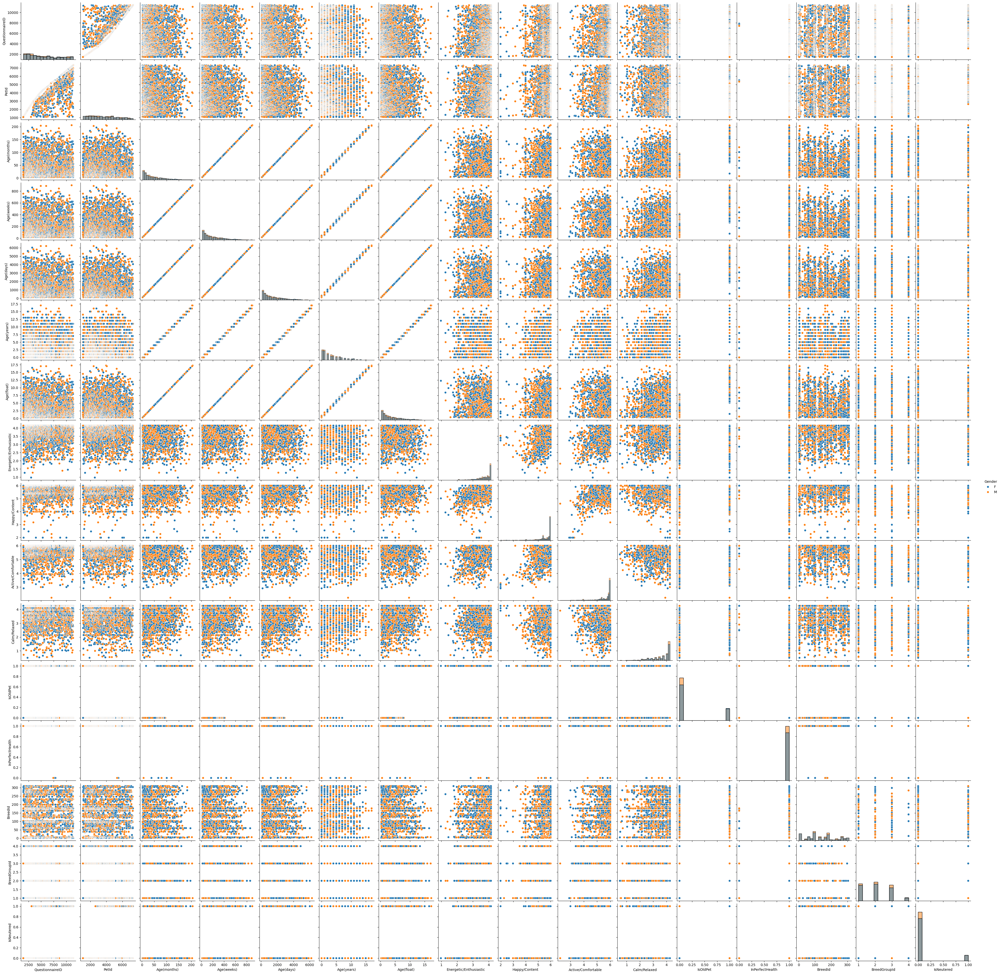

In [65]:
sns.pairplot(data = dogs, hue = 'Gender', diag_kind = 'hist', palette = 'tab10')

<Axes: xlabel='Breed', ylabel='Age(years)'>

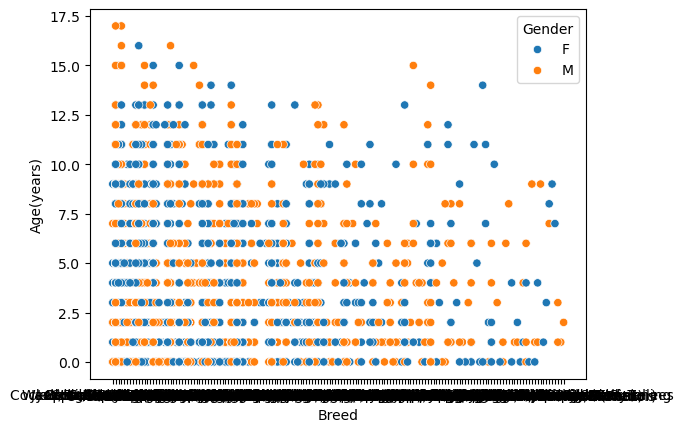

In [68]:
sns.scatterplot(x = "Breed", y = "Age(years)", data = dogs, hue = 'Gender')

In [71]:
dogs.to_csv('Dog_Vet_Info.csv', index = False)

## **Average Monthly Precipitation in Germany Dataset:**

In [11]:
rain = pd.read_excel('CDC_DWD_Regional_Monthly_Precip_Avg.xlsx')
rain.shape

In [12]:
rain

,Year,Month,Brandenburg/Berlin,Brandenburg,Baden-Wuerttemberg,Bavaria,Hesse,Mecklenburg-Western Pomerania,Lower Saxony,Lower Saxony/Hamburg/Bremen,North Rhine-Westphalia,Rhineland-Palatinate,Schleswig-Holstein,Saarland,Saxony,Saxony-Anhalt,Thuringia/Saxony-Anhalt,Thuringia,Germany
0,1881,1,20.4,20.3,36.2,22.5,33.2,16.8,35.1,34.9,40.6,39.3,21.5,52.8,21.8,23.5,25.0,26.8,28.7
1,1881,2,24.2,24.1,56.7,39.4,56.0,21.7,43.9,43.8,68.2,63.7,30.5,77.0,34.7,29.0,36.5,46.0,43.7
2,1881,3,60.7,60.7,84.6,89.0,99.5,43.2,91.3,90.9,124.7,95.4,55.4,101.4,101.5,74.4,84.6,97.5,86.6
3,1881,4,8.8,8.8,64.6,52.4,26.2,5.2,11.9,11.8,28.4,41.9,7.7,48.4,26.3,11.1,18.3,27.4,30.1
4,1881,5,31.3,31.3,61.5,95.0,31.1,16.3,25.8,25.8,31.9,38.0,30.0,36.7,57.9,30.4,33.8,38.0,47.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1731,2025,4,14.0,14.1,31.4,23.9,41.6,10.9,28.9,28.9,58.2,36.2,25.7,35.2,28.9,28.7,32.8,38.1,30.0
1732,2025,5,32.5,32.6,57.8,55.5,48.5,37.7,43.0,43.1,47.7,43.4,55.6,41.9,53.3,41.5,46.3,52.5,47.9
1733,2025,6,36.3,36.5,74.1,69.7,55.2,58.9,62.4,62.5,57.2,58.6,72.6,60.3,47.9,35.8,39.2,43.6,58.8
1734,2025,7,135.0,135.0,131.2,136.8,89.4,128.6,93.1,93.8,82.8,98.3,139.6,106.8,118.0,84.7,87.3,90.7,113.5


In [13]:
rain.dtypes

Year                               int64
Month                              int64
Brandenburg/Berlin               float64
Brandenburg                      float64
Baden-Wuerttemberg               float64
Bavaria                          float64
Hesse                            float64
Mecklenburg-Western Pomerania    float64
Lower Saxony                     float64
Lower Saxony/Hamburg/Bremen      float64
North Rhine-Westphalia           float64
Rhineland-Palatinate             float64
Schleswig-Holstein               float64
Saarland                         float64
Saxony                           float64
Saxony-Anhalt                    float64
Thuringia/Saxony-Anhalt          float64
Thuringia                        float64
Germany                          float64
dtype: object

In [14]:
rain.rename(columns = {'Lower Saxony': 'LowerSaxony', 'Lower Saxony/Hamburg/Bremen': 'LowerSaxony/Hamburg/Bremen', 'Baden-Wuerttemberg': 'Baden-W\u00FCerttemberg'}, inplace = True)
# Renamed for simplicity
rain["Month"] = rain["Month"].astype(int).astype(str).str.zfill(2)
rain["Month"] = rain["Month"].astype(int) # Fixing the way Month was entered

rain["Date"] = pd.to_datetime(dict(year = rain["Year"], month = rain["Month"], day = 1))
rain = rain[['Date'] + [col for col in rain.columns if col != 'Date']]

rain.to_csv('Regional_Avg_Rain_MONTH.csv', index = False)

In [15]:
rain = rain.drop(['Month', 'Year'], axis = 1) # Unneeded columns now that Date exists

In [16]:
rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1736 entries, 0 to 1735
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Date                           1736 non-null   datetime64[ns]
 1   Brandenburg/Berlin             1736 non-null   float64       
 2   Brandenburg                    1736 non-null   float64       
 3   Baden-Wüerttemberg             1736 non-null   float64       
 4   Bavaria                        1736 non-null   float64       
 5   Hesse                          1736 non-null   float64       
 6   Mecklenburg-Western Pomerania  1736 non-null   float64       
 7   LowerSaxony                    1736 non-null   float64       
 8   LowerSaxony/Hamburg/Bremen     1736 non-null   float64       
 9   North Rhine-Westphalia         1736 non-null   float64       
 10  Rhineland-Palatinate           1736 non-null   float64       
 11  Schleswig-Holstei

In [17]:
rain.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,1736,1953-04-16 14:11:03.594470144,1881-01-01 00:00:00,1917-02-22 00:00:00,1953-04-16 00:00:00,1989-06-08 12:00:00,2025-08-01 00:00:00,NaN
Brandenburg/Berlin,1736.0,47.210426,0.7,29.475,43.45,60.7,202.9,25.155207
Brandenburg,1736.0,47.202995,0.7,29.4,43.45,60.6,202.7,25.117033
Baden-Wüerttemberg,1736.0,78.292108,1.4,49.85,73.65,102.4,218.4,37.932686
Bavaria,1736.0,75.902247,0.9,47.9,71.0,100.0,245.4,36.564813
Hesse,1736.0,62.746947,1.4,40.6,59.1,80.925,191.3,30.424644
Mecklenburg-Western Pomerania,1736.0,50.007776,0.9,31.775,46.3,64.625,222.8,25.703093
LowerSaxony,1736.0,60.969585,2.2,39.5,57.6,79.5,188.7,29.194261
LowerSaxony/Hamburg/Bremen,1736.0,60.957258,2.2,39.4,57.65,79.425,188.2,29.194562
North Rhine-Westphalia,1736.0,70.575691,1.6,45.7,67.05,90.4,215.1,33.391707


In [18]:
rain.isna().sum()

Date                             0
Brandenburg/Berlin               0
Brandenburg                      0
Baden-Wüerttemberg               0
Bavaria                          0
Hesse                            0
Mecklenburg-Western Pomerania    0
LowerSaxony                      0
LowerSaxony/Hamburg/Bremen       0
North Rhine-Westphalia           0
Rhineland-Palatinate             0
Schleswig-Holstein               0
Saarland                         0
Saxony                           0
Saxony-Anhalt                    0
Thuringia/Saxony-Anhalt          0
Thuringia                        0
Germany                          0
dtype: int64

## Visualization:

<Axes: xlabel='Date', ylabel='Germany'>

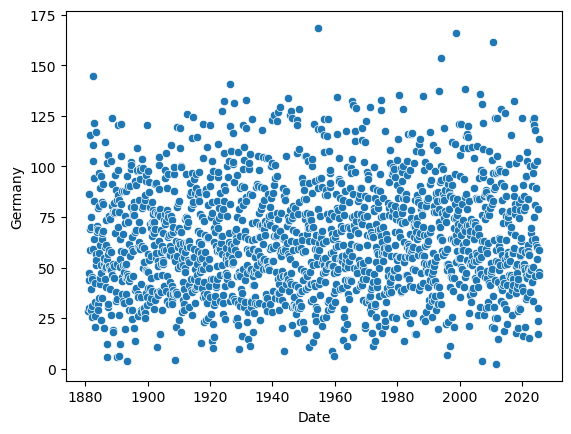

In [9]:
sns.scatterplot(x = "Date", y = "Germany", data = rain)

In [10]:
rain.to_csv('Regional_Avg_Rain.csv', index = False)